# Ανάλυση και Επεξεργασία Γεωχωρικών Δεδομένων

## *Άσκηση 2: Γεωχωρικές Υπηρεσίες και Διαδικτυακές Εφαρμογές*

- Ονομ/νυμο: Χρήστος Νίκου
- AM: 03400146
- Ιδιότητα: Μεταπτυχιακός φοιτητής Επιστήμης Δεδομένων και Μηχανικής Μάθησης (ΕΔΕΜΜ)
- Ηλεκτρονική Διεύθυνση: christosnikou@mail.ntua.gr / chrisnick92@gmail.com


# Table of Contents
- [Introduction](#intro)
    - [1.1 Short description](#intro11)
    - [1.2 Installation of modules/libraries](#intro12)

- [Tasks](#tasks)
    - [Task 1](#task1) *Data Gathering and Data Description*
    - [Task 2](#task21) *Kastoria*
      - [2.1](#task211) *Kastoria RGB Vizualizations*
      - [2.2](#task212) *Clipping the Images*
      - [2.3](#task213) *NDVI Vizualizations*
      - [2.4](#task214) *Time series of the spectral indices*
      - [2.5](#task25) *Meteorological Analysis - Kastoria*
    
    - [Task 3](#task3) *Geospatial queries*
      - [3.1](#task31) *Downloading the data from WebServices*
      - [3.2](#task32) *Performing geospatial queries*
        - [3.2.1](#task321) *Query 1: Administrative regions of Greece and Airports*
        - [3.2.2](#task322) *Query 2: Settlements of Greece within 1km near some airport*
        - [3.2.3](#task323) *Query 3: Transportation in Attica*
        - [3.2.4](#task324) *Query 4: Administrative regions of Greece and Coastlines*
        - [3.2.5](#task325) *Query 5: Administrative regions of Greece and Railroads*
        - [3.2.6](#task326) *Query 6: Which rivers flow by the most European Countries?*
        - [3.2.7](#task327) *Query 7: European countries and Rivers*
      - [3.3](#task33) *Geospatial Analysis on Belgium*
        - [3.3.1](#task331) *Corine Land Cover - 2018* 
        - [3.3.2](#task332) *Meteorological Analysis - Brussels*
        - [3.3.3](#task333) *Meteorological Comparison Brussels - Athens*
    - [Task 4](#task4) *Interactive Maps*
       - [4.1](#task41) *An interactive map for Greece*
       - [4.2](#task42) *Corine Land Cover Interactive map*

In [4]:
!pip install rasterio
!pip install owslib
!pip install requests
!pip install contextily
!pip install pandas fiona shapely pyproj rtree --upgrade
!pip install geopandas --upgrade
!pip install folium --upgrade
!pip install matplotlib mapclassif
!pip install leafmap
!pip install fiona

!apt update
!apt upgrade
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirement
!apt install python3-rtree 
# Install Geopandas
#!pip install git+git://github.com/geopandas/geopandas.git
!pip install geopandas==0.10.0
# Install descartes - Geopandas requirement
!pip install descartes 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached geopandas-0.10.2-py2.py3-none-any.whl (1.0 MB)
  Attempting uninstall: geopandas
    Found existing installation: geopandas 0.10.0
    Uninstalling geopandas-0.10.0:
      Successfully uninstalled geopandas-0.10.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-w

In [5]:
import os 

#owslib
from owslib.wms import WebMapService
from owslib.wfs import WebFeatureService
from branca.element import Figure

#matplotlib-pandas-geopandas etc
from matplotlib.colors import ListedColormap, LinearSegmentedColormap # For customized cmaps
from shapely.geometry import Point, MultiPoint
import contextily as cx
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.style
import seaborn as sns
import pandas as pd
import numpy as np
import leafmap
import imageio
import folium

from IPython.display import Image
from requests import Request
import geojson
from pyproj import CRS

#rasterio
import rasterio
import fiona
import rasterio.features
import rasterio.warp
import rasterio.mask
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling

In [6]:
path = '/content/drive/MyDrive/ColabNotebooks/Geospatial' # path of kastoria.tif

kastoria = rasterio.open(os.path.join(path, 'Kastoria.tif'))


poly_path = os.path.join(path,'Lab2','polygon')
shape_file = gpd.read_file(os.path.join(poly_path, 'POLYGON.shp'))

## Task 3 - *Geospatial queries*<a name="task3"></a>  

>*Implement and practice various geospatial data and operations on vector data using the Geopandas library. Generate and present static maps and times series of the data.*

### 3.1 *Downloading the data from WebServices* <a name="task31"></a>

>*Download various vector data from [https://geodata.gov.gr](https://geodata.gov.gr), like adminastritive district boundaries, railway lines, hospital locations etc.*

At this point we download the periphereies data from [https://geodata.gov.gr](https://geodata.gov.gr) using the WFService.

In [7]:
gov_url = 'http://geodata.gov.gr/geoserver/ows'
gov = WebFeatureService(gov_url)

Below we construct some utility functions to make our data more readable.

In [8]:
def get_data(url, layer, version = '1.1.1', typename = True):
  # Specify parameters (read data in json format).
  if typename:
    params = dict(service='WFS', version=version, request='GetFeature', 
          typeName= layer, outputFormat='json')
    r = Request('GET', url, params=params).prepare().url
  else:
    params = dict(service='WFS', version=version, request='GetFeature', 
          typeNames= layer, outputFormat='json')
    r = Request('GET', url, params=params).prepare().url

  # Create GeoDataFrame from geojson
  return gpd.read_file(r)


def encoder(wfs):
  contents = list(wfs.contents)
  encoder = {}
  for content in contents:
    encoder[wfs[content].title] = content
  return encoder

def layer_report(service, layer_name):
  print(f"WMS general info:\n")
  print(f"WMS version: {service.identification.version}")
  print(f"WMS title: {service.identification.title}")
  print(f"WMS abstract: {service.identification.abstract}")
  print(f"Provider name: {service.provider.name}")
  print(f"Provider address: {service.provider.contact.address}")
  print(f"\nLayer info:\n")
  print('- Title: ', service.contents[layer_name].title)
  print('- BoundingBox: ', service.contents[layer_name].boundingBox)
  print('- BoundingBoxWGS84: ', service.contents[layer_name].boundingBoxWGS84)
  print('- CrsOptions: ', service[layer_name].crsOptions)
  print('- Format Options: ', service.getOperationByName('GetMap').formatOptions)
  print('- Layer styles: ', service[layer_name].styles)
  print('- Operations ', [op.name for op in service.operations])

In [9]:
gov_layers = encoder(gov)

Below we can see the first 10 layers of our data.

In [10]:
list(gov_layers.keys())[:10]

['AERODROMIA',
 'Arxaiologikos_xoros',
 'FRAGMATA_ELLADAS',
 'USA Population',
 'aigialos_alexandroupolis',
 'aigialos_deh_chaliwth',
 'aigialos_fira',
 'aigialos_fourkaria',
 'aigialos_freatida',
 'aigialos_karapolith']

### 3.2 *Geospatial queries* <a name="task32"></a>

>*Perform geospatial queries using operations from geopandas library like within, intersect, buffer and spatial join.*

#### 3.2.1 *Query 1: Administrative regions of Greece and Airports.* <a name="task321"></a>

>*Plot the airports together with the adminastrive locations of Greece and find in which adminastrive location each airport belongs to.*

In [11]:
# Reading the data
aerodromia = get_data(gov_url, gov_layers['AERODROMIA'])
periphereies = get_data(gov_url, gov_layers['periphereies'])

In [12]:
# Spatial join
airports_per = gpd.sjoin(aerodromia, periphereies,
                         predicate = 'intersects')[['onoma', 'PER']].rename(columns = {'onoma': 'ΑΕΡΟΔΡΟΜΙΟ',
                                                                                       'PER': 'ΠΕΡΙΦΕΡΕΙΑ'})
airports_per.head(10)

,ΑΕΡΟΔΡΟΜΙΟ,ΠΕΡΙΦΕΡΕΙΑ
0,"Δασκαλογιάννης CHQ Χανιά, Σούδα",Π. ΚΡΗΤΗΣ
1,Μάλεμε,Π. ΚΡΗΤΗΣ
2,Τυμπάκι LG54\n,Π. ΚΡΗΤΗΣ
3,Νίκος Καζαντζάκης LGIR HER Ηράκλειο,Π. ΚΡΗΤΗΣ
4,Καστέλι LGTL\n,Π. ΚΡΗΤΗΣ
5,Σητεία LGST JSH,Π. ΚΡΗΤΗΣ
6,Δωδεκανήσου-Κάσος- ΔΑΚΑ LGKS/KSJ-2245041587,Π. ΝΟΤΙΟΥ ΑΙΓΑΙΟΥ
7,Δωδεκανήσου-Κάρπαθος-ΚΑΚΠ LGKP/AOK-2245091120,Π. ΝΟΤΙΟΥ ΑΙΓΑΙΟΥ
8,"Διαγόρας LGRP RHO Παραδείσι, Ρόδου",Π. ΝΟΤΙΟΥ ΑΙΓΑΙΟΥ
9,Μαρίτσα LGRD Ρόδος,Π. ΝΟΤΙΟΥ ΑΙΓΑΙΟΥ


In order to plot a static map with the airports and the administrative regions we download a raster image with the RGB bands of Europe and we keep the polygon that corresponds only to the area of Greece. To download the raster data we use the Web-Map service provided by the following [link](https://www.geoseer.net/rl.php?ql=4b4a6ba584ec26c2&p=1&q=landsat%20europe#).

In [13]:
rgb_europe = WebMapService('https://geobretagne.fr/geoserver/photo/ows?SERVICE=WMS&')

In [14]:
rgb_europe_layers = encoder(rgb_europe)

In [15]:
layer_report(rgb_europe, rgb_europe_layers['landsat Europe 150m']) # Info about the layer

WMS general info:

WMS version: 1.1.1
WMS title: Service de visualisation cartographique (WMS) des  photographies aériennes [GéoBretagne]
WMS abstract: Le service permet de consulter les photographies aériennes tuilées en Bretagne - [GéoBretagne] représentées sur des cartes.
Provider name: Partenariat GeoBretagne
Provider address: 10 rue Maurice Fabre

Layer info:

- Title:  landsat Europe 150m
- BoundingBox:  (-59.999904, 29.999986910352526, 60.000098905726574, 74.999988, 'EPSG:4326')
- BoundingBoxWGS84:  (-59.999904, 29.999986910352526, 60.000098905726574, 74.999988)
- CrsOptions:  ['EPSG:27561', 'EPSG:900913', 'EPSG:3948', 'EPSG:3942', 'EPSG:4258', 'EPSG:23032', 'EPSG:27573', 'EPSG:4171', 'EPSG:27574', 'EPSG:2154', 'EPSG:23031', 'EPSG:23030', 'EPSG:27562', 'EPSG:3035', 'EPSG:4326', 'EPSG:27572', 'EPSG:3857', 'EPSG:27564', 'EPSG:27563', 'EPSG:27571']
- Format Options:  ['image/png', 'application/atom xml', 'application/atom+xml', 'application/bil', 'application/bil16', 'application/b

We save the image locally in a geotiff format and we use rasterio to open the tiff file.

In [16]:
img = rgb_europe.getmap(layers = [rgb_europe_layers['landsat Europe 150m']],
                   styles=['raster'],
                   srs='EPSG:4326',
                   bbox=(19.245431845516844, 34.67580776389063, 30.096271159893487, 41.767651977574225),
                   #size = (1600, 2560),
                   size = (2000, 3600),
                   format='image/geotiff'
               )

In [17]:
out = open('europe_rgb.geotiff', 'wb')
out.write(img.read())
out.close()

In [18]:
raster = rasterio.open('europe_rgb.geotiff')

Now we are ready to plot our first static map.

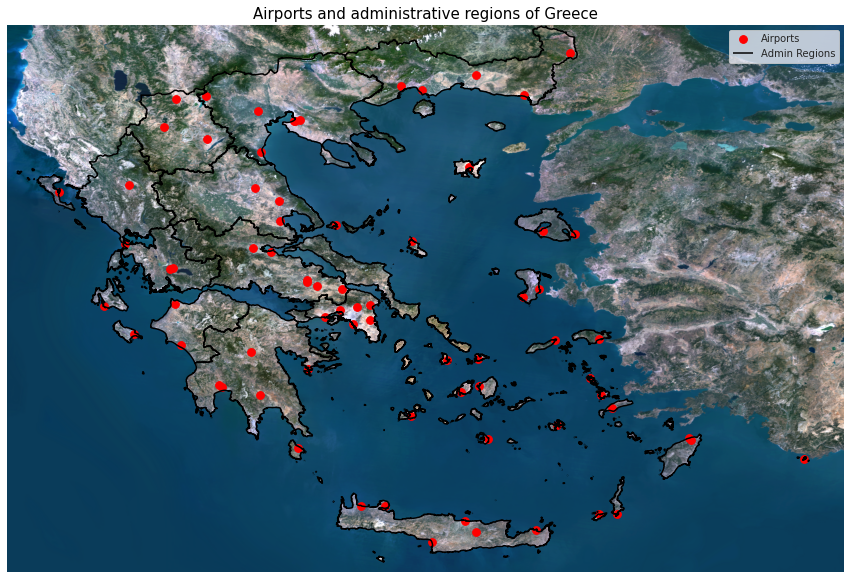

In [19]:
fig, ax = plt.subplots(figsize = (15,15))

sns.set_style("dark")
aerodromia.to_crs(epsg = '4326').plot(ax = ax, color = 'red', markersize = 60, label = 'Airports')
periphereies.to_crs(epsg = '4326')['geometry'].boundary.plot(ax = ax,
                                        alpha = 1, color = 'black',
                                        label = 'Admin Regions')

ax.set_title('Airports and administrative regions of Greece',
             fontsize = 15)

show(raster, ax = ax)

# Add basemap
ax.set_axis_off()
plt.legend()
plt.show()

#### 3.2.2 *Query 2: Settlements of Greece within 1km near some airport.* <a name="task322"></a>


>*Which settlements of Greece contain some airport within 1km radius distance?*

In order to find the settlements we use the *buffer* operation. First, we give a buff of size 500m to every point of the two Geopandas GeoDataFrames corresponding to the airports and the settlements. Then, to find the settlements within 1km distance from some airport we perform the *spatial join* operation. Below are the details of this query.

In [20]:
oikismoi = get_data(gov_url, gov_layers['oikismoi'])[['NAME_OIK', 'NAME_OTA', 'NAME_NOM', 'geometry', 'lat', 'lon']]

buffer_oikismoi = oikismoi['geometry'].buffer(distance = 500)
buffer_aerodromia = aerodromia['geometry'].buffer(distance = 500)

In [21]:
buffed_oikismoi = oikismoi.copy()
buffed_oikismoi.loc[:,'geometry'] = buffer_oikismoi
buffed_aerodromia = aerodromia.copy()
buffed_aerodromia.loc[:,'geometry'] = buffer_aerodromia

Below we can see the first 15 settlements and the corresponding airports within 1km distance.

In [22]:
oikismoi_aerodromia = gpd.sjoin(buffed_oikismoi, buffed_aerodromia)[['NAME_OIK',
                                                       'NAME_OTA', 'NAME_NOM', 'onoma', 'geometry', 'lat', 'lon']].rename(columns = {'NAME_OIK': 'OIKISMOS',
                                                                                                                       'NAME_NOM': 'NOMOS',
                                                                                                                       'onoma': 'AERODROMIO'})
oikismoi_aerodromia.head(15)

,OIKISMOS,NAME_OTA,NOMOS,AERODROMIO,geometry,lat,lon
907,Παραδείσιον,ΔΗΜΟΣ ΠΕΤΑΛΟΥΔΩΝ,ΝΟΜΟΣ ΔΩΔΕΚΑΝΗΣΟΥ,"Διαγόρας LGRP RHO Παραδείσι, Ρόδου","POLYGON ((866612.314 4035775.475, 866609.906 4...",36.397423,28.081709
1354,Βαγιές,ΔΗΜΟΣ ΠΕΤΑΛΟΥΔΩΝ,ΝΟΜΟΣ ΔΩΔΕΚΑΝΗΣΟΥ,"Διαγόρας LGRP RHO Παραδείσι, Ρόδου","POLYGON ((867346.978 4035892.089, 867344.570 4...",36.398190,28.089935
982,Μάννα,ΔΗΜΟΣ ΕΡΜΟΥΠΟΛΕΩΣ,ΝΟΜΟΣ ΚΥΚΛΑΔΩΝ,Σύρου LGSO JSY,"POLYGON ((583851.072 4141813.793, 583848.664 4...",37.419380,24.941969
1272,Παρθένιον,ΔΗΜΟΣ ΛΕΡΟΥ,ΝΟΜΟΣ ΔΩΔΕΚΑΝΗΣΟΥ,Λέρου LGLE LRS,"POLYGON ((749431.487 4119203.651, 749429.079 4...",37.186123,26.804281
1274,¶ργος,ΔΗΜΟΣ ΚΑΛΥΜΝΙΩΝ,ΝΟΜΟΣ ΔΩΔΕΚΑΝΗΣΟΥ,Κάλυμνος LGKY JKL,"POLYGON ((762436.456 4093946.518, 762434.048 4...",36.955193,26.941810
1316,Ανάληψις,ΔΗΜΟΣ ΑΣΤΥΠΑΛΑΙΑΣ,ΝΟΜΟΣ ΔΩΔΕΚΑΝΗΣΟΥ,Αστυπάλαια LGPL JTV,"POLYGON ((713807.218 4050357.463, 713804.810 4...",36.574863,26.383945
1353,Αερολιμήν,ΔΗΜΟΣ ΠΕΤΑΛΟΥΔΩΝ,ΝΟΜΟΣ ΔΩΔΕΚΑΝΗΣΟΥ,Μαρίτσα LGRD Ρόδος,"POLYGON ((869339.797 4033508.192, 869337.389 4...",36.375990,28.110970
1458,Αγία Παρασκευή,ΔΗΜΟΣ ΜΥΤΙΛΗΝΗΣ,ΝΟΜΟΣ ΛΕΣΒΟΥ,Οδυσσέας Ελύτης LGMT MJT Μυτιλήνη,"POLYGON ((724923.603 4325766.140, 724921.195 4...",39.052160,26.593464
1576,Έξω Φάρος,ΔΗΜΟΣ ΑΓΙΟΥ ΚΗΡΥΚΟΥ,ΝΟΜΟΣ ΣΑΜΟΥ,Ικαρία LGIK JIK,"POLYGON ((707290.503 4172367.245, 707288.096 4...",37.675213,26.344845
1588,Αγία Κυριακή,ΔΗΜΟΣ ΑΓΙΟΥ ΚΗΡΥΚΟΥ,ΝΟΜΟΣ ΣΑΜΟΥ,Ικαρία LGIK JIK,"POLYGON ((706588.784 4173032.564, 706586.377 4...",37.681362,26.337082


In the map below we can see the exact location of these settlements.

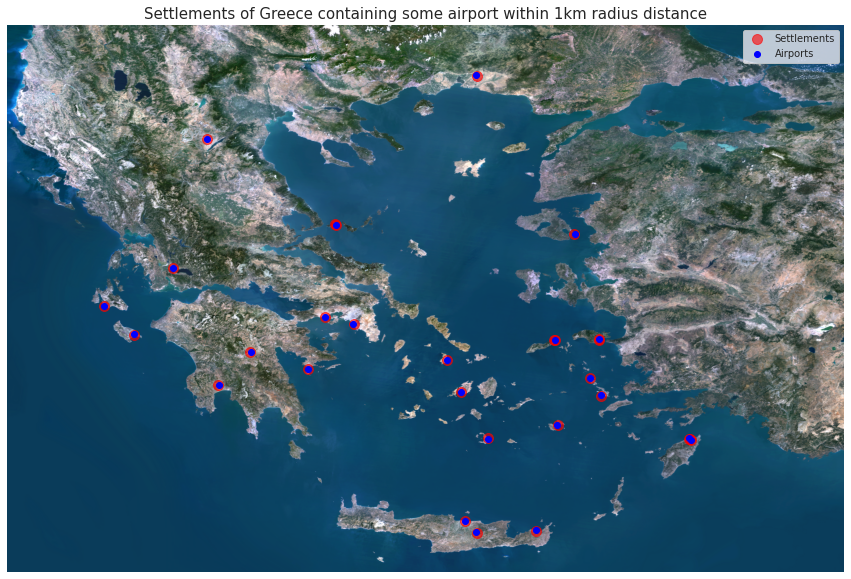

In [23]:
fig, ax = plt.subplots(figsize = (15,15))

sns.set_style("dark")
oikismoi.loc[(oikismoi['NAME_OIK'].isin(oikismoi_aerodromia['OIKISMOS'])) &\
             (oikismoi['NAME_NOM'].isin(oikismoi_aerodromia['NOMOS'])) &\
              (oikismoi['NAME_OTA'].isin(oikismoi_aerodromia['NAME_OTA']) &\
               (oikismoi['lon'].isin(oikismoi_aerodromia['lon'])))].to_crs(epsg = '4326').plot(ax = ax,
                                      alpha = 0.6, color = 'red', edgecolor = 'red',
                                      markersize = 100, label = 'Settlements')
               
aerodromia.loc[aerodromia['onoma'].isin(oikismoi_aerodromia['AERODROMIO'])].to_crs(epsg
                                                                                   = '4326').plot(ax = ax,
                                                                                                  alpha = 1, color = 'blue',
                                                                                                  label = 'Airports')

ax.set_title('Settlements of Greece containing some airport within 1km radius distance',
             fontsize = 15)
# Add basemap
show(raster, ax = ax)

ax.set_axis_off()

plt.legend()
plt.show()

#### 3.2.3 *Query 3: Transportation in Attica* <a name="task323"></a>

>*Which settlements in Attica contain the most transportation stations?*

Since our data for the settlements of Greece correspond to geometry points we can only find the settlements with the most transportation stations from a reference point. To visualize the stations we use a basemap by contextily and we restrict the map using the boundingBox of Attica. To find the settlements located in Attica we first generate the convex hull of the stations and we keep only the settlements contained in it.

In [24]:
oasa = get_data(gov_url, gov_layers['stathmoi_k_staseis_oasa'])[['name', 'street', 'mode', 'geometry']]

In [25]:
oasa_hull_geom = oasa.dissolve().convex_hull

In [26]:
attiki = periphereies[periphereies['PER'] == 'Π. ΑΤΤΙΚΗΣ']
oikismoi_attikis = gpd.sjoin(attiki, oikismoi, how = 'right',
                             predicate = 'contains').dropna()[['geometry', 'NAME_OIK']].rename(columns = {"NAME_OIK": "OIKISMOS"})

In [27]:
print(f"- Η περιφέρεια Αττικής περιέχει {oikismoi_attikis.shape[0]} οικισμούς")

- Η περιφέρεια Αττικής περιέχει 482 οικισμούς


In [28]:
oikismoi_attikis = oikismoi_attikis.sjoin(gpd.GeoDataFrame({'Temp': [1],
                                                            'geometry' : oasa_hull_geom[0]}))[['OIKISMOS', 'geometry']]

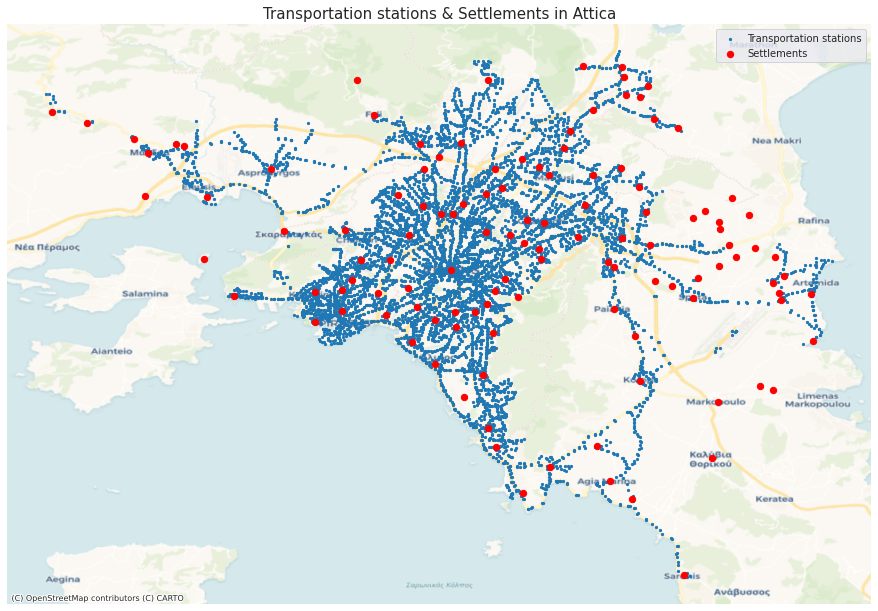

In [29]:
fig, ax = plt.subplots(figsize = (12,12))

oasa.to_crs(epsg = '4326').plot(ax = ax, markersize = 5,
                                label = 'Transportation stations')
oikismoi_attikis.to_crs(epsg = '4326').plot(ax = ax, markersize = 40,
                                            label = 'Settlements', color = 'red')

cx.add_basemap(ax = ax,
               crs=oasa.to_crs(epsg = '4326').crs.to_string(),
               source=cx.providers.CartoDB.Voyager
              )

ax.set_title('Transportation stations & Settlements in Attica', fontsize = 15)
ax.set_axis_off()
plt.gca().set_axis_off()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())

plt.legend()
plt.show()

Now we create a buffer of radius 1.5km around the settlements and we count the transportation stations contained in that buffer. Below we can see the top 50 settlements and the corresponding number of transportation stations.

In [30]:
radius = 1500
buffer_oikismoi = oikismoi_attikis['geometry'].buffer(distance = radius)
oikismoi_attikis.loc[:, 'geometry'] = buffer_oikismoi

oasa_oikismoi_attikis = gpd.sjoin(oikismoi_attikis, oasa, how = 'inner', predicate = 'contains')
oasa_oikismoi_attikis = oasa_oikismoi_attikis.groupby(by = ['OIKISMOS']).size().reset_index(name = 'Counts').sort_values(by = 'Counts',
                                                                                                                                     ascending = False)

In [31]:
num_oikismoi = 50
print(f"- Top {num_oikismoi} settlements of Attica containing the most transportation stations within 1.5km radius:\n")
print(f"  Settlement{20*' '}Number\n")
for i in range(num_oikismoi):
  data = oasa_oikismoi_attikis.iloc[i,:]
  num_hyphens = 25 - len(str(data['OIKISMOS']))
  print(f"{i+1}. {data['OIKISMOS']} {num_hyphens*'-'}> {data['Counts']}")

- Top 50 settlements of Attica containing the most transportation stations within 1.5km radius:

  Settlement                    Number

1. Αθήναι -------------------> 274
2. Πειραιεύς ----------------> 221
3. Κορυδαλλός ---------------> 217
4. Νίκαια -------------------> 195
5. Δάφνη --------------------> 195
6. Καισαριανή ---------------> 193
7. Περιστέριον --------------> 190
8. Υμηττός ------------------> 189
9. ¶γιος Δημήτριος ----------> 183
10. Νέα Χαλκηδών -------------> 183
11. Βύρων --------------------> 180
12. Νέα Σμύρνη ---------------> 174
13. Νέα Φιλαδέλφεια ----------> 169
14. Ίλιον --------------------> 165
15. ¶γιοι Ανάργυροι ----------> 163
16. Κερατσίνιον --------------> 159
17. Νέα Ιωνία ----------------> 159
18. Καλλιθέα -----------------> 153
19. Ζωγράφος -----------------> 150
20. Αγία Βαρβάρα -------------> 149
21. Γαλάτσιον ----------------> 146
22. ¶γιος Ιωάννης Ρέντης -----> 144
23. Πετρούπολις --------------> 135
24. Χαλάνδριον ---------------> 135
25. Αιγά

#### 3.2.4 *Query 4: Administrative regions of Greece and coastlines.* <a name="task324"></a>

>*Calculate the total length of coastline for each administrative region separately.*

In [32]:
aktogrammh = get_data(gov_url, gov_layers['aktogrammh'])

In [33]:
per_aktogrammh = periphereies.overlay(aktogrammh, how = 'intersection', keep_geom_type = False)
per_aktogrammh = per_aktogrammh[per_aktogrammh['TYPE'] == 'AKTH'][['PER', 'geometry']]
per_aktogrammh['MHKOS'] = per_aktogrammh['geometry'].length
per_aktogrammh = per_aktogrammh.groupby(by = ['PER'])['MHKOS'].sum().reset_index(name = 'MHKOS').sort_values(by ='MHKOS',
                                                                                                             ascending = False)

In [34]:
print(f"{10*'*'} Coastline length per Administrative region {10*'*'}\n")
title = f"{6*' '}Administrative region{13*' '}Length(km)"
print(f"{len(title)*'*'}*")
print(title)
print(f"{len(title)*'*'}*")
for i in range(per_aktogrammh.shape[0]):
  data = per_aktogrammh.iloc[i,:]
  num_hyphens = 35 - len(str(data['PER']))
  line_data = f"{i+1}. {data['PER']}{num_hyphens*'-'}> {data['MHKOS']/1000:.2f}"
  print(line_data + f"{(len(title)-len(line_data))*' '}*")
print(f"{len(title)*'*'}*")

********** Coastline length per Administrative region **********

***************************************************
      Administrative region             Length(km)
***************************************************
1. Π. ΝΟΤΙΟΥ ΑΙΓΑΙΟΥ------------------> 2001.12   *
2. Π. ΣΤΕΡΕΑΣ ΕΛΛΑΔΑΣ-----------------> 816.38    *
3. Π. ΒΟΡΕΙΟΥ ΑΙΓΑΙΟΥ-----------------> 770.83    *
4. Π. ΠΕΛΟΠΟΝΝΗΣΟΥ--------------------> 678.35    *
5. Π. ΚΡΗΤΗΣ--------------------------> 644.66    *
6. Π. ΙΟΝΙΩΝ ΝΗΣΩΝ--------------------> 631.82    *
7. Π. ΑΤΤΙΚΗΣ-------------------------> 588.15    *
8. Π. ΚΕΝΤΡΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ------------> 504.03    *
9. Π. ΔΥΤΙΚΗΣ ΕΛΛΑΔΑΣ-----------------> 489.90    *
10. Π. ΘΕΣΣΑΛΙΑΣ-----------------------> 417.39   *
11. Π. ΗΠΕΙΡΟΥ-------------------------> 253.77   *
12. Π. ΑΝΑΤΟΛΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ - ΘΡΑΚΗΣ--> 238.94   *
***************************************************


#### 3.2.5 *Query 5: Administrative regions of Greece and railways.* <a name="task325"></a>

>*Calculate the total length of railroad for each administrative region separately.*

In [35]:
diktyo = get_data(gov_url, gov_layers['sidhrodromiko_diktyo'])

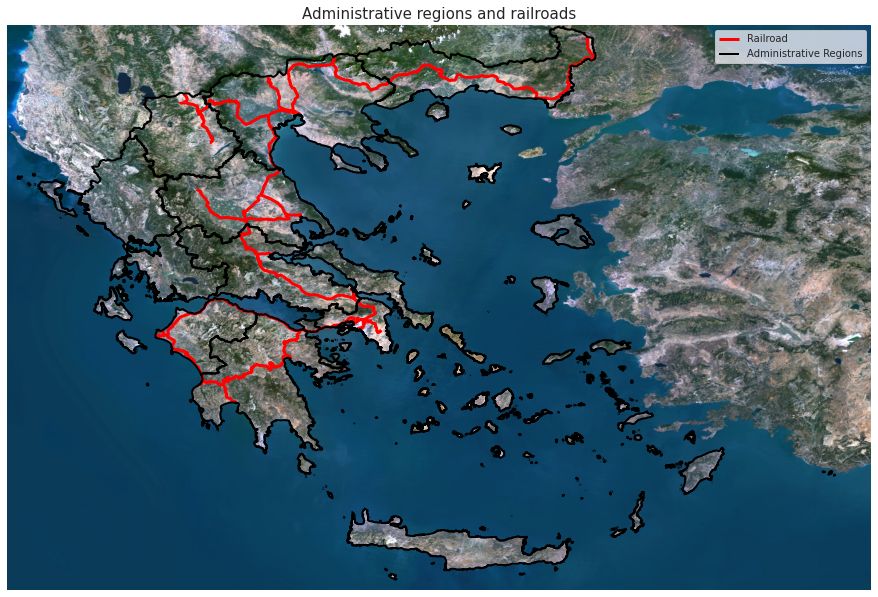

In [36]:
fig, ax = plt.subplots(figsize = (12,12))

sns.set_style("dark")
diktyo.to_crs(epsg = '4326').plot(ax = ax, color = 'red',label = 'Railroad',
                                  linewidth = 3)
periphereies.to_crs(epsg = '4326')['geometry'].boundary.plot(ax = ax,
                                        alpha = 1, color = 'black',
                                        label = 'Administrative Regions', linewidth = 2)

ax.set_title('Administrative regions and railroads',
             fontsize = 15)

show(raster, ax = ax)

# Add basemap
ax.set_axis_off()
plt.gca().set_axis_off()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())

plt.legend()
plt.show()

In [37]:
per_diktyo = periphereies.overlay(diktyo, how = 'intersection',
                                  keep_geom_type = False)[['PER','geometry']]
per_diktyo['MHKOS'] = per_diktyo['geometry'].length
per_diktyo = per_diktyo.groupby(by = ['PER'])['MHKOS'].sum().reset_index(name = 'MHKOS').sort_values(by = 'MHKOS',
                                                                                                     ascending = False)

In [38]:
print(f"{5*'*'} Railroad length per Administrative region {5*'*'}\n")
title = f"{6*' '}Administrative Region{15*' '}Length(km)"
print(f"{len(title)*'*'}*")
print(title)
print(f"{len(title)*'*'}*")
for i in range(per_diktyo.shape[0]):
  data = per_diktyo.iloc[i,:]
  num_hyphens = 35 - len(str(data['PER']))
  line_data = f"{i+1}. {data['PER']}{num_hyphens*'-'}> {data['MHKOS']/1000:.2f}"
  print(line_data + f"{(len(title)-len(line_data))*' '}*")
print(f"{len(title)*'*'}*")

***** Railroad length per Administrative region *****

*****************************************************
      Administrative Region               Length(km)
*****************************************************
1. Π. ΚΕΝΤΡΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ------------> 552.69      *
2. Π. ΠΕΛΟΠΟΝΝΗΣΟΥ--------------------> 383.34      *
3. Π. ΑΝΑΤΟΛΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ - ΘΡΑΚΗΣ--> 366.67      *
4. Π. ΘΕΣΣΑΛΙΑΣ-----------------------> 303.61      *
5. Π. ΣΤΕΡΕΑΣ ΕΛΛΑΔΑΣ-----------------> 271.29      *
6. Π. ΔΥΤΙΚΗΣ ΕΛΛΑΔΑΣ-----------------> 242.12      *
7. Π. ΑΤΤΙΚΗΣ-------------------------> 216.40      *
8. Π. ΔΥΤΙΚΗΣ ΜΑΚΕΔΟΝΙΑΣ--------------> 121.29      *
*****************************************************


#### 3.2.6 *Query 6: European Rivers* <a name="task326"></a>

>*Which rivers flow by the most European Countries?*

At this point we count the number of the European countries that each river flows. We load two WFServices containing the vector data for the european rivers and countries. Then we filter the DataFrame of the countries and we keep only the list of countries given in this [list](https://www.worldometers.info/geography/how-many-countries-in-europe/).

In [39]:
rivers = get_data('https://geoserver.mundialis.de/geoserver/wfs',
                  'natural:ne_10m_rivers_europe')
european_countries = get_data('http://geo.vliz.be:80/geoserver/wfs',
                              'Europe:europecountries')

In [40]:
rivers = rivers[rivers['featurecla'] == 'River'] # keep only the rivers

In [41]:
all_rivers = rivers['name'].unique()

In [42]:
import requests
header = {
  "User-Agent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.75 Safari/537.36",
  "X-Requested-With": "XMLHttpRequest"
}

r = requests.get('https://www.worldometers.info/geography/how-many-countries-in-europe/', headers=header)
tables = pd.read_html(r.text)

In [43]:
europe_countries = set(tables[0]['Country'])

In [44]:
european_countries = european_countries[european_countries['cntryname'].isin(europe_countries)]

In [45]:
test = gpd.sjoin(rivers, european_countries, how = 'inner')

In [46]:
rivers_dict = {}
for river in all_rivers:
  rivers_dict[river] = set(test[test['name'] == river]['cntryname'])

In [47]:
countries_per_river = pd.DataFrame({'River': list(zip(*rivers_dict.items()))[0],
                                    'Countries': list(zip(*rivers_dict.items()))[1]})

In [48]:
countries_per_river['number'] = 0
for i in range(countries_per_river.shape[0]):
  countries_per_river.iloc[i,2] = len(countries_per_river.iloc[i,1])

countries_per_river.sort_values(by = 'number', ascending = False, inplace = True)

Below we can see the top 10 rivers flowing from the most European countries.

In [49]:
countries_per_river.head(10)

,River,Countries,number
80,Sûre,"{Germany, Belgium, Luxembourg}",3
40,Raab,"{Hungary, Austria, Slovakia}",3
73,Latorytsya,"{Ukraine, Hungary, Slovakia}",3
171,Someşul Cald,"{Romania, Hungary}",2
47,Merkys,"{Lithuania, Belarus}",2
77,Ljubljanica,"{Slovenia, Croatia}",2
207,Slana,"{Hungary, Slovakia}",2
210,Crisul Alb,"{Romania, Hungary}",2
318,Mesta,"{Bulgaria, Greece}",2
39,Drau,"{Croatia, Hungary}",2


#### 3.2.7 *Query 7: European countries and Rivers* <a name="task327"></a>

>*Which European countries have the most rivers?*

In [50]:
test = test[~test['name'].isnull()]
countries_dict = {}
for country in europe_countries:
  countries_dict[country] = set(test[test['cntryname'] == country]['name'])

rivers_per_country = pd.DataFrame({'Country': list(zip(*countries_dict.items()))[0],
                                    'Rivers': list(zip(*countries_dict.items()))[1]})

rivers_per_country['number'] = 0
for i in range(rivers_per_country.shape[0]):
  rivers_per_country.iloc[i,2] = len(rivers_per_country.iloc[i,1])

rivers_per_country.sort_values(by = 'number', ascending = False, inplace = True)

In [51]:
rivers_per_country.head(15)

,Country,Rivers,number
17,France,"{Petit Gland, Somme, Conie, Vilaine, Sarthe, M...",27
40,Germany,"{Luzicka Nisa, Salzach, Unstrut, Fulda, Warme ...",25
25,Spain,"{Pisuerga, Mijares, Sil, Guadiana Menor, Segur...",24
11,Belarus,"{Ubort, Dysna, Pronya, Servač, Styr, Shchara, ...",21
38,Sweden,"{Västerdal, Ljusnan, Lainio, Svartån, Torne, F...",18
37,Romania,"{Ialomița, Beli Timok, Yantra, Timiş, Argeș, S...",18
14,Norway,"{Västerdal, Glomma, Otta, Faxälven, Namsen, Ma...",17
23,Ukraine,"{Snov, Latorytsya, Haryn, Ubort, Ros, Prut, So...",17
12,Poland,"{Luzicka Nisa, Prosna, Drwęca, Dunajec, Wkra, ...",17
31,Finland,"{Kala, Kymijoki, Kokemaen, Siika, Vuoksi, Ouna...",16


### 3.3 *Geospatial Analysis on Belgium* <a name="task33"></a>

#### 3.3.1 *Corine Land Cover - 2018* <a name="task331"></a>

Now we turn draw our attention to Belgium where we can use the WFService to get the data of the Corine Land Cover for the year 2018. The source where we pull the data is the in following [link](https://www.geoseer.net/rl.php?ql=0e305deee537335b&p=6&q=corine%20land%20cover#).

In [52]:
corine_belgium = get_data('https://wms.ngi.be/inspire23/landcover/wfs', 'landcover:LandCoverUnit')

In [53]:
belgium_wms = WebMapService('https://wms.ngi.be/inspire23/landcover/ows?SERVICE=WMS&')
belgium_layers = encoder(belgium_wms)

In [54]:
layer_report(belgium_wms, 'LandCoverUnit')

WMS general info:

WMS version: 1.1.1
WMS title: INSPIRE View service - CORINE Land Cover-2018-Belgium
WMS abstract: This web service allows viewing datasets from CORINE Land Cover-2018-Belgium
Provider name: National Geographic Institute
Provider address: Kortenberglaan 115

Layer info:

- Title:  LandCoverUnit
- BoundingBox:  (514655.59565632173, 520911.53092782426, 797149.1523945626, 746440.85331934, 'EPSG:3812')
- BoundingBoxWGS84:  (2.419278507190049, 49.48177856819602, 6.488459850048744, 51.52746137693894)
- CrsOptions:  ['EPSG:3812', 'EPSG:3035', 'EPSG:4258', 'EPSG:4326', 'EPSG:3857']
- Format Options:  ['image/png', 'application/atom xml', 'application/atom+xml', 'application/json;type=utfgrid', 'application/openlayers', 'application/openlayers2', 'application/openlayers3', 'application/pdf', 'application/rss xml', 'application/rss+xml', 'application/vnd.google-earth.kml', 'application/vnd.google-earth.kml xml', 'application/vnd.google-earth.kml+xml', 'application/vnd.google-ea

We define a variable named `corine_colors` that corresponds the codes of the various areas of use to the color codes according to the Corine Land Cover [standards](https://collections.sentinel-hub.com/corine-land-cover/readme.html).

In [55]:
import requests

url = 'https://collections.sentinel-hub.com/corine-land-cover/readme.html' # Get the Color code for the Corine Land cover

header = {
  "User-Agent": "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/50.0.2661.75 Safari/537.36",
  "X-Requested-With": "XMLHttpRequest"
}

r = requests.get(url, headers=header)

corine_info = pd.read_html(r.text)
corine_info = corine_info[1]

corine_colors = {} # Define a dictionary mapping the code to Color codes
corine_info['code'] = corine_info['Label'].str.split(' - ').str[0]
corine_info['Land use'] = corine_info['Label'].str.split(' - ').str[1]
corine_info['code'] = corine_info['code'].astype('string')
corine_info.drop('Color', axis = 1, inplace = True)

corine_belgium.rename(columns = {'lcclass' : 'code'}, inplace = True)
corine_belgium['code'] = corine_belgium['code'].astype('string')

for _,row in corine_info.iterrows():
  corine_colors[row['code']] = row['Color Code']

Now we determine the boundingBox covered by our data in the EPSG 4326 in order to clip our Raster data of the RGB Image of Europe.

In [56]:
corine_belgium.to_crs('epsg:4326').dissolve().bounds

,minx,miny,maxx,maxy
0,2.18688,49.487988,6.421944,51.594544


Now we clip our raster data according to the above coordinates.

In [57]:
img = rgb_europe.getmap(layers = [rgb_europe_layers['landsat Europe 150m']],
                   styles=['raster'],
                   srs='EPSG:4326',
                   bbox=(2.18688, 49.487988, 6.421944, 51.594544),
                   #size = (1600, 2560),
                   size = (3600, 3600),
                   format='image/geotiff'
               )

In [58]:
out = open('belgium_raster.geotiff', 'wb')
out.write(img.read())
out.close()

In [59]:
belgium_raster = rasterio.open('belgium_raster.geotiff')

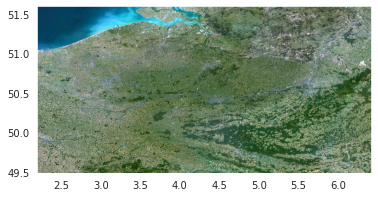

In [60]:
show(belgium_raster)
plt.show()

Now we combine our raster data with the vector data of Belgium to produce a static Corine Land Cover map.

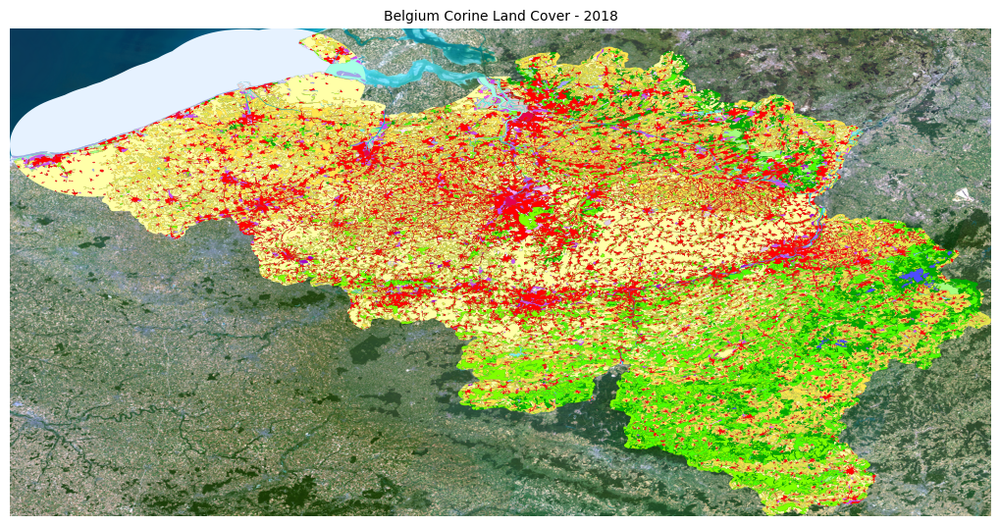

In [61]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

fig,ax = plt.subplots(figsize = (10,12))
corine_belgium.to_crs(epsg = '4326').plot(ax = ax, color = corine_belgium['code'].map(corine_colors))
show(belgium_raster, ax = ax)

ax.set_title('Belgium Corine Land Cover - 2018', fontsize = 10)
plt.gca().set_axis_off()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())

plt.show()

Furthermore, we can also add the cities of Switzerland by downloading from the following [link](https://www.geoseer.net/rl.php?ql=9acc7a6fbdadbeae&p=1&q=European%20cities#), using the WFService, the vector data of the European countries. Then, by filtering the DataFrame we keep only the cities of Belgium.

In [62]:
european_cities = get_data('http://map.fmi.fi/geoserver/wfs',
                           'KAP:europe_cities_eureffin')

In [63]:
european_cities

,id,type,nation,cntryname,level,name,namepre,code,province,provname,unprov,conurb,geometry
0,europe_cities_eureffin.1,13,34,Spain,1,Santa Cruz de Tenerife,None,None,38,Santa Cruz de Tenerife,0,None,POINT (-3950426.396 4063585.100)
1,europe_cities_eureffin.2,13,34,Spain,1,Palmas de Gran Canaria,Las,None,35,Las Palmas,0,None,POINT (-3874803.405 3981357.717)
2,europe_cities_eureffin.3,10,351,Portugal,1,Lisboa,None,None,11,Lisboa,0,None,POINT (-2676829.060 4963529.888)
3,europe_cities_eureffin.4,11,351,Portugal,1,Porto,None,None,2,Porto,0,None,POINT (-2503648.858 5214567.063)
4,europe_cities_eureffin.5,13,351,Portugal,1,Vila Nova de Gaia,None,None,2,Porto,0,None,POINT (-2504069.811 5212579.718)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1262,europe_cities_eureffin.1263,10,374,Armenia,1,Jerevan,None,None,0,Armenia,0,None,POINT (1998373.672 4600884.324)
1263,europe_cities_eureffin.1264,13,994,Azerbaydzhan,1,Nachicevan,None,None,3,Nakhichevan',0,None,POINT (2094832.550 4505512.110)
1264,europe_cities_eureffin.1265,13,374,Armenia,1,Kirovakan,None,None,0,Armenia,0,None,POINT (1977970.245 4668584.810)
1265,europe_cities_eureffin.1266,10,994,Azerbaydzhan,1,Baku,None,None,1,Azerbaydzan,0,None,POINT (2446376.709 4727870.667)


In [64]:
belgium_cities = european_cities[european_cities['cntryname'] == 'Belgium']

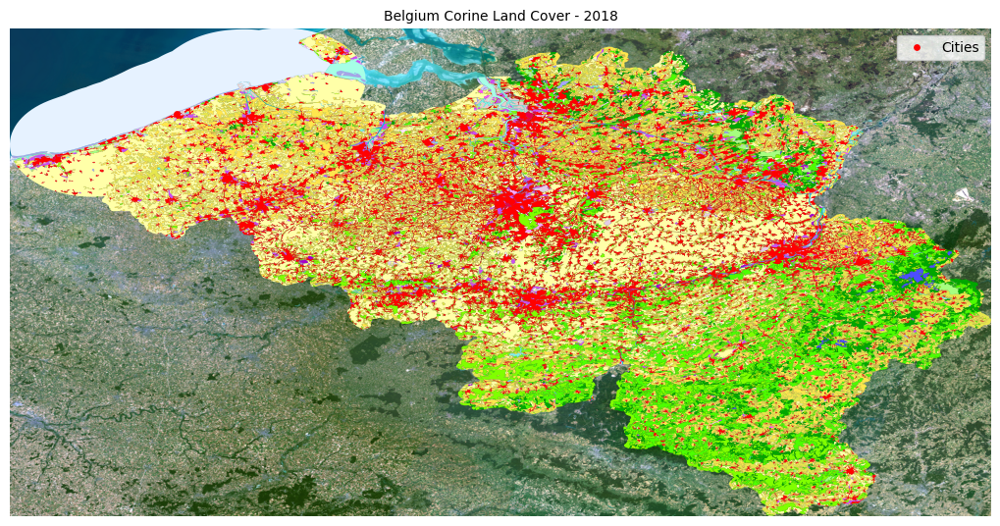

In [65]:
fig,ax = plt.subplots(figsize = (10,12))
corine_belgium.to_crs(epsg = '4326').plot(ax = ax, color = corine_belgium['code'].map(corine_colors))
belgium_cities.to_crs(epsg = '4326').plot(ax = ax, label = 'Cities',
                                      color = 'red', markersize = 15)

show(belgium_raster, ax = ax)

ax.set_title('Belgium Corine Land Cover - 2018', fontsize = 10)
plt.gca().set_axis_off()
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, 
            hspace = 0, wspace = 0)
plt.margins(0,0)
plt.gca().xaxis.set_major_locator(plt.NullLocator())
plt.gca().yaxis.set_major_locator(plt.NullLocator())
plt.legend()
plt.show()

#### 3.3.2 *Meteorological Analysis on Brussels* <a name="task332"></a>

Now we focus our attention on the capital of Belgium, Brussels. As in the case with Kastoria we choose a random point at the center of Brussels and we collect meteorological measurements for this point from the portal of [NASA](https://power.larc.nasa.gov/data-access-viewer/). Below we can see the coordinates in the EPSG 4326 system of the point at the center of Brussels.

In [66]:
belgium_cities.to_crs(epsg='4326')[belgium_cities['name'] == 'Bruxelles']['geometry']

488    POINT (4.35021 50.84920)
Name: geometry, dtype: geometry

In [67]:
brussels_poly_path = os.path.join(path, 'Lab2', 'brussels')
brussels_poly = gpd.read_file(os.path.join(brussels_poly_path, 'POLYGON.shp'))

In [68]:
brussels_poly

,geometry
0,"POLYGON ((4.34350 50.84168, 4.36511 50.84168, ..."


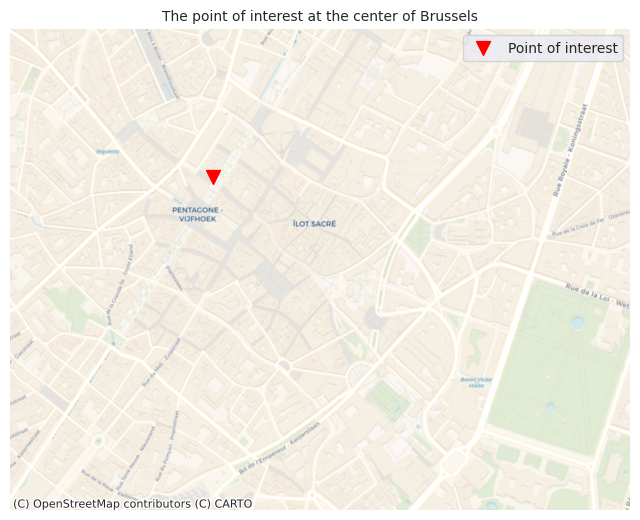

In [69]:
mpl.rcParams.update(mpl.rcParamsDefault)
sns.set_style('dark')
fig, ax = plt.subplots(figsize = (8,8))

brussels_poly.plot(ax = ax, alpha = 0)
cx.add_basemap(ax = ax,
               crs=brussels_poly.crs.to_string(),
               source=cx.providers.CartoDB.Voyager
              )
belgium_cities[belgium_cities['name'] == 'Bruxelles'].to_crs(epsg = '4326').plot(ax = ax, label = 'Point of interest',
                                      color = 'red', markersize = 100, marker = 'v')
ax.set_title('The point of interest at the center of Brussels', fontsize = 10)
ax.set_axis_off()
plt.legend()
plt.show()

Now we load our data for the point of interest into a pandas DataFrame. For completeness we state again the variables of interest.

- *All Sky Insolation Clearness Index:* A fraction representing clearness of the atmosphere; the all sky insolation that is transmitted through the atmosphere to strike the surface of the earth divided by the average of top of the atmosphere total solar irradiance incident.

- *All Sky Surface UVA Irradiance:* The ultraviolet A (UVA 315nm-400nm) irradiance under all sky conditions.

- *All Sky Surface UVB Irradiance*: The ultraviolet B (UVB 280nm-315nm) irradiance under all sky conditions.

- *Temperature at 2 Meters*: The average air (dry bulb) temperature at 2 meters above the surface of the earth.

- *Specific Humidity at 2 Meter*: The ratio of the mass of water vapor to the total mass of air at 2 meters (kg water/kg total air).

- *Relative Humidity at 2 Meters*: The ratio of actual partial pressure of water vapor to the partial pressure at saturation, expressed in percent.

- *Wind Speed at 10 Meters*: The average of wind speed at 10 meters above the surface of the earth.

In [70]:
brussels_meteo = pd.read_csv('https://raw.githubusercontent.com/ChrisNick92/Geospatial-Data/main/Lab2/MeteorologicalData/brussels.csv',
                             header = 15).rename(columns = {'ALLSKY_KT': 'Sky Clearness', 'ALLSKY_SFC_UVA': 'UVA Radiance Index',
                                                            'ALLSKY_SFC_UVB': 'UVB Radiance Index', 'T2M': 'Temperature',
                                                            'QV2M': 'Specific Humidity', 'WS10M': 'Wind Speed', 'RH2M': 'Relative Humidity'})
# Create a date column and covert to datetime
brussels_meteo['date'] = pd.to_datetime(brussels_meteo['YEAR'].astype('str') + '-' + brussels_meteo['MO'].astype('str') + '-' +  brussels_meteo['DY'].astype('str'),
                                    format = "%Y-%m-%d")
brussels_meteo.head()

,YEAR,MO,DY,Sky Clearness,UVA Radiance Index,UVB Radiance Index,Temperature,Specific Humidity,Wind Speed,Relative Humidity,date
0,2021,1,1,0.38,1.47,0.01,0.87,3.91,3.21,96.88,2021-01-01
1,2021,1,2,0.32,1.44,0.01,1.78,4.15,2.00,96.25,2021-01-02
2,2021,1,3,0.20,0.96,0.01,0.99,3.85,3.72,94.56,2021-01-03
3,2021,1,4,0.21,0.97,0.01,1.23,3.91,5.77,94.75,2021-01-04
4,2021,1,5,0.15,0.70,0.00,0.66,3.72,4.31,94.81,2021-01-05


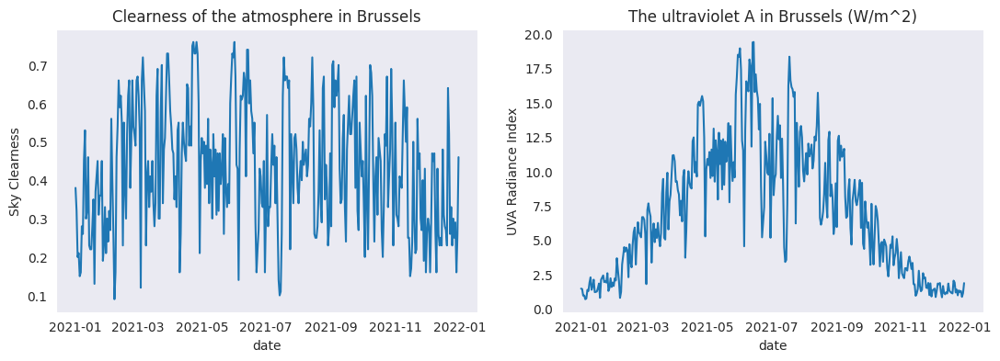

In [71]:
sns.set_style('dark')

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 4))
sns.lineplot(x = 'date', y = 'Sky Clearness',
                     data = brussels_meteo, ax = ax[0]).set(title =  'Clearness of the atmosphere in Brussels')
sns.lineplot(x = 'date', y = 'UVA Radiance Index',
                     data = brussels_meteo, ax = ax[1]).set(title = 'The ultraviolet A in Brussels (W/m^2)')
plt.show()

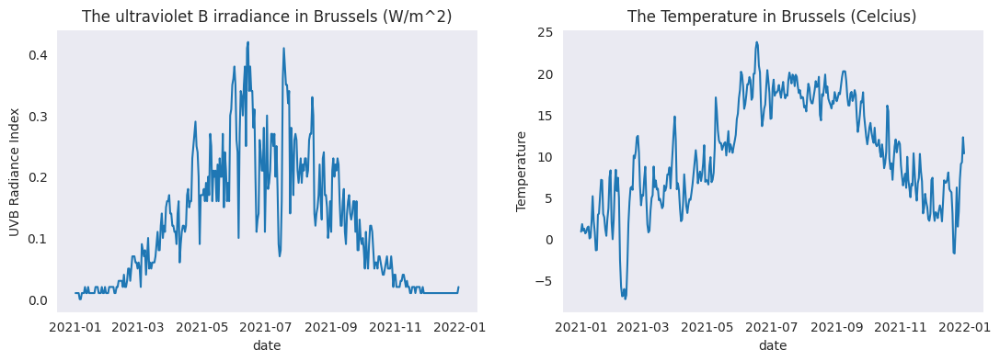

In [72]:
sns.set_style('dark')

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 4))
sns.lineplot(x = 'date', y = 'UVB Radiance Index',
                     data = brussels_meteo, ax = ax[0]).set(title =  'The ultraviolet B irradiance in Brussels (W/m^2)')
sns.lineplot(x = 'date', y = 'Temperature',
                     data = brussels_meteo, ax = ax[1]).set(title = 'The Temperature in Brussels (Celcius)')
plt.show()

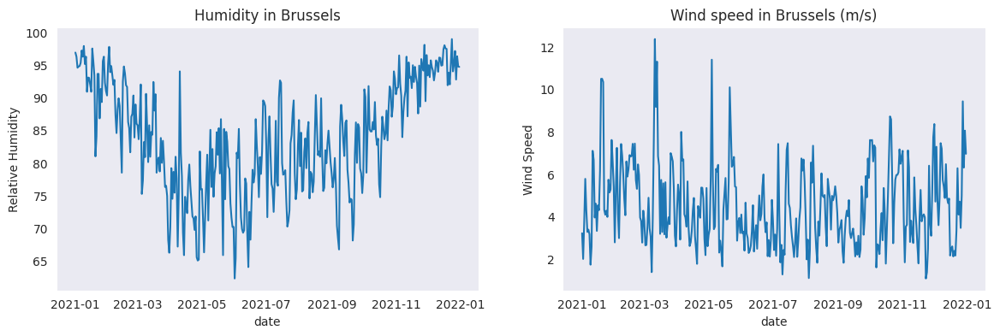

In [73]:
sns.set_style('dark')

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (14, 4))
sns.lineplot(x = 'date', y = 'Relative Humidity',
                     data = brussels_meteo, ax = ax[0]).set(title =  'Humidity in Brussels')
sns.lineplot(x = 'date', y = 'Wind Speed',
                     data = brussels_meteo, ax = ax[1]).set(title = 'Wind speed in Brussels (m/s)')
plt.show()

#### 3.3.3 *Meteorological Comparison Brussels - Athens* <a name="task333"></a>

Now we compare Brussels to Athens with respect to the above meteorological variables. Below we see the selected point corresponding to the center of Athens and its coordinates on the EPSG 4326 system.

In [74]:
athens_poly_path = os.path.join(path, 'Lab2', 'athens')
athens_poly = gpd.read_file(os.path.join(athens_poly_path, 'POLYGON.shp'))
athens_poly

,geometry
0,"POLYGON ((23.70996 37.96474, 23.74905 37.96474..."


In [75]:
european_cities[european_cities['name'] == 'Athina']['geometry'].to_crs(epsg = '4326')

984    POINT (23.73510 37.97580)
Name: geometry, dtype: geometry

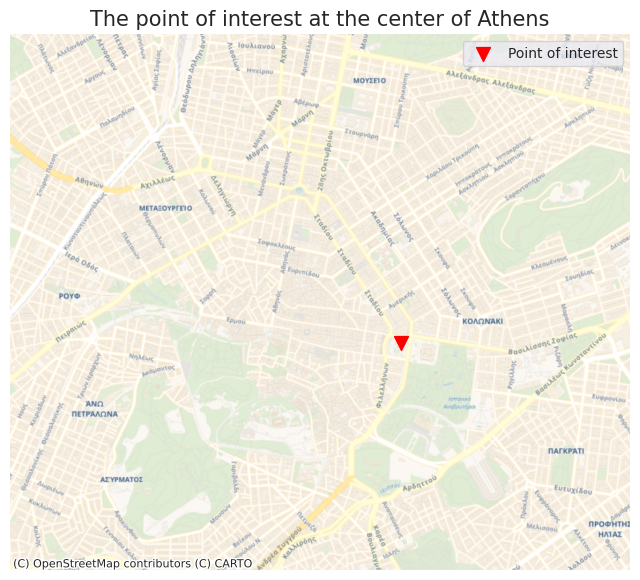

In [76]:
fig, ax = plt.subplots(figsize = (8,8))

athens_poly.plot(ax = ax, alpha = 0)
cx.add_basemap(ax = ax,
               crs=athens_poly.crs.to_string(),
               source=cx.providers.CartoDB.Voyager
              )
european_cities[european_cities['name'] == 'Athina'].to_crs(epsg = '4326').plot(ax = ax, label = 'Point of interest',
                                      color = 'red', markersize = 100, marker = 'v')
ax.set_title('The point of interest at the center of Athens', fontsize = 15)
ax.set_axis_off()
plt.legend()
plt.show()

In [77]:
brussels_meteo['Place'] = 'Brussels'

In [83]:
athens_meteo = pd.read_csv('https://raw.githubusercontent.com/ChrisNick92/Geospatial-Data/main/Lab2/MeteorologicalData/athens.csv',
                             header = 15).rename(columns = {'ALLSKY_KT': 'Sky Clearness', 'ALLSKY_SFC_UVA': 'UVA Radiance Index',
                                                            'ALLSKY_SFC_UVB': 'UVB Radiance Index', 'T2M': 'Temperature',
                                                            'QV2M': 'Specific Humidity', 'WS10M': 'Wind Speed', 'RH2M': 'Relative Humidity'})
# Create a date column and covert to datetime
athens_meteo['date'] = pd.to_datetime(athens_meteo['YEAR'].astype('str') + '-' + athens_meteo['MO'].astype('str') + '-' + athens_meteo['DY'].astype('str'),
                                    format = "%Y-%m-%d")
athens_meteo['Place'] = 'Athens'
athens_meteo.head()

,YEAR,MO,DY,Sky Clearness,UVA Radiance Index,UVB Radiance Index,Temperature,Specific Humidity,Wind Speed,Relative Humidity,date,Place
0,2021,1,1,0.69,5.87,0.06,12.06,5.74,2.25,66.12,2021-01-01,Athens
1,2021,1,2,0.35,3.70,0.04,12.87,7.45,2.50,79.69,2021-01-02,Athens
2,2021,1,3,0.52,4.93,0.05,13.99,9.16,4.91,91.75,2021-01-03,Athens
3,2021,1,4,0.28,3.18,0.04,14.01,9.16,7.07,90.50,2021-01-04,Athens
4,2021,1,5,0.63,5.74,0.06,11.37,6.16,3.77,73.88,2021-01-05,Athens


In [84]:
athens_meteo.append(brussels_meteo)

,YEAR,MO,DY,Sky Clearness,UVA Radiance Index,UVB Radiance Index,Temperature,Specific Humidity,Wind Speed,Relative Humidity,date,Place
0,2021,1,1,0.69,5.87,0.06,12.06,5.74,2.25,66.12,2021-01-01,Athens
1,2021,1,2,0.35,3.70,0.04,12.87,7.45,2.50,79.69,2021-01-02,Athens
2,2021,1,3,0.52,4.93,0.05,13.99,9.16,4.91,91.75,2021-01-03,Athens
3,2021,1,4,0.28,3.18,0.04,14.01,9.16,7.07,90.50,2021-01-04,Athens
4,2021,1,5,0.63,5.74,0.06,11.37,6.16,3.77,73.88,2021-01-05,Athens
...,...,...,...,...,...,...,...,...,...,...,...,...
360,2021,12,27,0.25,1.23,0.01,7.15,6.23,5.00,97.12,2021-12-27,Brussels
361,2021,12,28,0.29,1.30,0.01,9.03,6.71,9.42,92.75,2021-12-28,Brussels
362,2021,12,29,0.16,0.87,0.01,9.23,7.08,6.30,96.31,2021-12-29,Brussels
363,2021,12,30,0.26,1.14,0.01,12.25,8.36,8.04,94.75,2021-12-30,Brussels


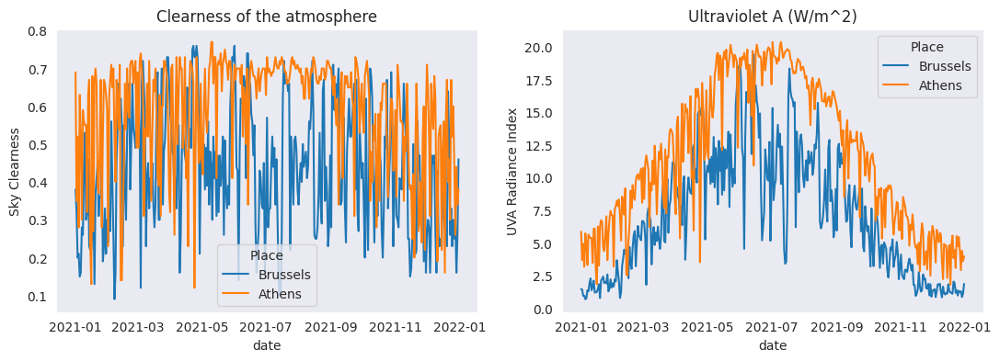

In [85]:
sns.set_style('dark')

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 4))
sns.lineplot(x = 'date', y = 'Sky Clearness',
                     data = brussels_meteo.append(athens_meteo, ignore_index=True), ax = ax[0],
             hue = 'Place').set(title =  'Clearness of the atmosphere')
sns.lineplot(x = 'date', y = 'UVA Radiance Index', hue = 'Place',
                     data = brussels_meteo.append(athens_meteo, ignore_index=True), ax = ax[1]).set(title = 'Ultraviolet A (W/m^2)')
plt.show()

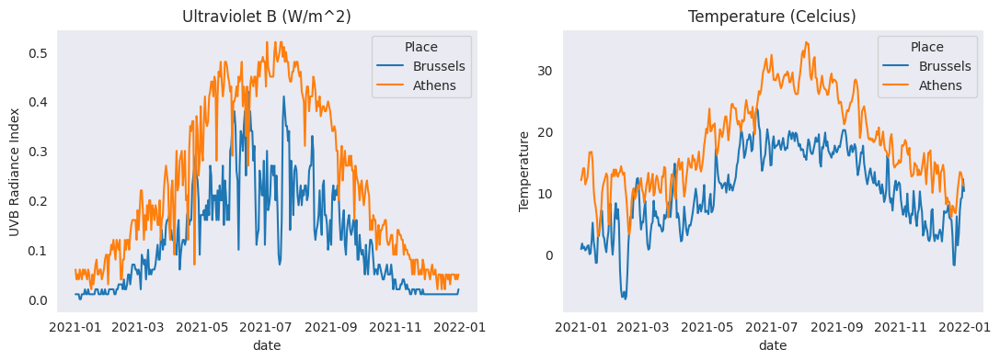

In [86]:
sns.set_style('dark')

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 4))
sns.lineplot(x = 'date', y = 'UVB Radiance Index',
                     data = brussels_meteo.append(athens_meteo, ignore_index=True), ax = ax[0],
             hue = 'Place').set(title =  'Ultraviolet B (W/m^2)')
sns.lineplot(x = 'date', y = 'Temperature',
                     data = brussels_meteo.append(athens_meteo, ignore_index=True), ax = ax[1],
             hue = 'Place').set(title = 'Temperature (Celcius)')
plt.show()

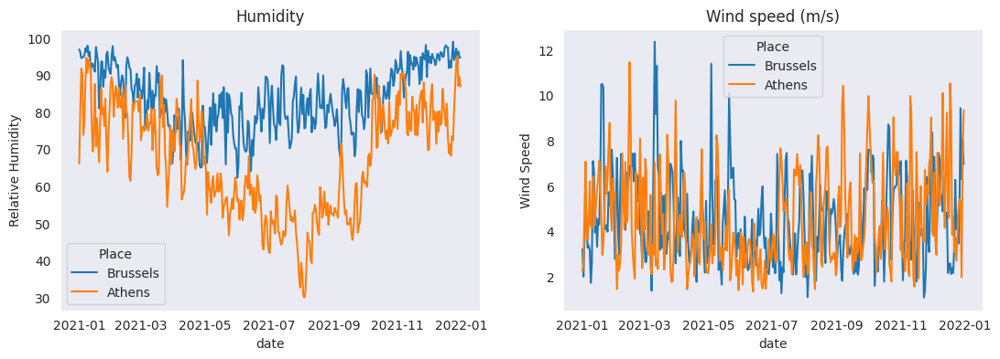

In [87]:
sns.set_style('dark')

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (13, 4))
sns.lineplot(x = 'date', y = 'Relative Humidity',
                     data = brussels_meteo.append(athens_meteo, ignore_index=True), ax = ax[0],
             hue = 'Place').set(title =  'Humidity')
sns.lineplot(x = 'date', y = 'Wind Speed',
                     data = brussels_meteo.append(athens_meteo, ignore_index=True), ax = ax[1],
             hue = 'Place').set(title = 'Wind speed (m/s)')
plt.show()

## *Task 4* <a name="task4"></a>

>*Combine the raster & vector data and produce intercative maps using the WebMapServices.*

### 4.1 *An interactive map for Greece* <a name="task41"></a>

The first interactive map shows the location of the Greece's airports, major cities, administrative boundaries, national parks, blue flags and lakes. Below we load the layers of interest from [https://data.gov.gr](https://data.gov.gr).

In [ ]:
diktyo = get_data(gov_url, gov_layers['sidhrodromiko_diktyo']).to_crs(4326)
periphereies = get_data(gov_url, gov_layers['periphereies']).to_crs(4326)
aerodromia = get_data(gov_url, gov_layers['AERODROMIA']).to_crs(4326)
galazies_simaies = get_data(gov_url, gov_layers['galazies_shmaies_2010']).to_crs(4326)
ethnika_parka = get_data(gov_url, gov_layers['ethnika_parka'])
limnes = get_data(gov_url, gov_layers['limnes'])

In order for our map to be more informative we add markers for every location. The small problem we have to face here is the fact that each national park may consist from several polygons, hence to avoid multiple markers on the same national parks we first calculate the centroid of these polygons and choose the centroid of these centroids to be our marker. This operation is performed by the following function named `centroid_of_centroids`.

In [ ]:
from shapely.geometry import Point, MultiPoint

def centroid_of_centroids(gpdf, target_col, crs):
  groups = gpdf[target_col].unique()
  centroid_df = pd.DataFrame()
  for group in groups:
    grouped_df = gpdf[gpdf[target_col] == group]
    x = grouped_df.centroid.x.mean()
    y = grouped_df.centroid.y.mean()
    centroid_df = pd.concat([centroid_df, pd.DataFrame({'NAME': [group],
                                                       'x': [x], 'y': [y]})])
  d = {'name': groups,
       'geometry':[Point(x,y) for x,y in zip(centroid_df['x'], centroid_df['y'])]}
  return gpd.GeoDataFrame(d, crs = crs).to_crs(4326)

In [ ]:
parka_centroids = centroid_of_centroids(ethnika_parka, 'NAME', ethnika_parka.crs)
limnes_centroids = centroid_of_centroids(limnes, 'NAME', limnes.crs)

In [ ]:
from branca.element import Figure
fig = Figure(width=1400, height=700)

m = folium.Map(location=[37.983810, 23.727539], zoom_start=10,
               tiles = None) # This is the main object, map

# adding features to the map
feature_airports = folium.FeatureGroup(name = 'Airports', overlay = True).add_to(m)
feature_diktyo = folium.FeatureGroup(name = 'Railroad', overlay = True).add_to(m)
feature_simaies = folium.FeatureGroup(name = 'Blue Flags (2010)', overlay = True).add_to(m)
feature_parka = folium.FeatureGroup(name = 'National Parks', overlay = True).add_to(m)
feature_limnes = folium.FeatureGroup(name = 'Lakes', overlay = True).add_to(m)
feature_poleis = folium.FeatureGroup(name = 'Major Cities', overlay = True).add_to(m)
feature_periphereies = folium.FeatureGroup(name = 'Administrative Boundaries', overlay = True).add_to(m)

for index, row in aerodromia.iterrows():
  folium.Marker(location = [row.loc['geometry'].y, row.loc['geometry'].x],
                popup = 'Airport\n'+ row.loc['onoma'], tooltip = 'click',
                icon = folium.Icon(icon = 'glyphicon-plane',
                                   prefix = 'glyphicon')).add_to(feature_airports)

for index, row in galazies_simaies.iterrows():
  folium.Marker(location = [row.loc['geometry'].y, row.loc['geometry'].x],
                popup = 'Beach\n'+ row.loc['WATERNAME'], tooltip = 'click',
                icon = folium.Icon(icon = 'glyphicon-flag',
                                   prefix = 'glyphicon')).add_to(feature_simaies)
for index, row in parka_centroids.iterrows():
  folium.Marker(location = [row['geometry'].y, row['geometry'].x],
                popup = row['name'], tooltip = 'click',
                icon = folium.Icon(icon = 'glyphicon-tree-deciduous',
                                   prefix = 'glyphicon', color = 'green')).add_to(feature_parka)
for index,row in limnes_centroids.iterrows():
  folium.Marker(location = [row['geometry'].y, row['geometry'].x],
                popup = row['name'], tooltip = 'click',
                icon = folium.Icon(icon = 'glyphicon-tint',
                                   prefix = 'glyphicon')).add_to(feature_limnes)

folium.Choropleth(limnes, fill_color = 'blue', fill_opacity = 0.2,
                  overlay = True).add_to(feature_limnes)
folium.Choropleth(diktyo, line_color = 'red', line_weight=1).add_to(feature_diktyo)
folium.Choropleth(periphereies.boundary, line_color = 'black', line_width = 3,
                  line_weight = 3).add_to(feature_periphereies)
folium.Choropleth(ethnika_parka, fill_opacity = 0.2,
                  fill_color = 'green', overlay = True).add_to(feature_parka)

for index, row in european_cities[european_cities['cntryname'] == 'Greece'].to_crs(epsg = '4326').iterrows():
  folium.Marker(location = [row.loc['geometry'].y, row.loc['geometry'].x],
                popup = 'City of\n' +row.loc['name'], tooltip = 'click',
                icon = folium.Icon(icon = 'glyphicon-home',
                                   prefix = 'glyphicon', color = 'red')).add_to(feature_poleis)


folium.raster_layers.WmsTileLayer('https://geobretagne.fr/geoserver/photo/ows?SERVICE=WMS&',
                                  'landsat_europe',
                                  styles = 'raster',
                                  name = 'Landsat Europe Layer').add_to(m)

m.add_child(feature_airports)
m.add_child(feature_diktyo)
m.add_child(feature_simaies)
m.add_child(feature_parka)
m.add_child(feature_poleis)
folium.LayerControl().add_to(m)
fig.add_child(m)

### 4.2 *Corine Land Cover Interactive map* <a name="task42"></a>

At this subsection we create an interactive mapping of the Corine Land Cover data available on [https://www.geoseer.net](https://www.geoseer.net). The interactive map covers Italy, Switzerland, Croatia and Slovenia.

In [ ]:
m = leafmap.Map(center=[41.902782, 12.496366], zoom=7)

m.add_wms_layer(
    url = 'https://geobretagne.fr/geoserver/photo/ows?SERVICE=WMS&',
    layers = 'landsat_europe',
    name = 'Landsat RGB Europe',
    format = 'image/png',
    transparent = True
)

m.add_wms_layer(
    url = 'http://sdi.isprambiente.it:80/geoserver/lc1/ows?SERVICE=WMS&',
    layers= 'clc18_it_4258',
    name= 'Corine Land Cover Italy 2018',
    format="image/png",
    transparent=True,
)

m.add_wms_layer(
    url = 'https://sdi.georhena.eu/geoserver/ows?SERVICE=WMS&',
    layers= '	georhena:CLC_2018_CRS_ORK',
    name= 'Corine Land Cover Switzerland 2018',
    format="image/png",
    transparent=True,
)

m.add_wms_layer(
    url = 'http://servisi.azo.hr/tlo/ows?SERVICE=WMS&',
    layers= 'clc2018',
    name= 'Corine Land Cover Croatia, Slovenia 2018',
    format="image/png",
    transparent=True,
)



m.add_legend(title = 'Land Use', labels = list(corine_info['Land use'].unique()),
             colors = list(corine_info['Color Code'].unique()))

m
